<a href="https://colab.research.google.com/github/dschwizz/ideal-spoon/blob/main/UCI%20Household%20Electricity%20Usage%20Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


## Load relevant libraries


In [ ]:
!pip install tslearn
!pip install PSF_Py
from google.colab import drive
drive.mount('/content/drive')

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 793 kB 4.0 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Mounted at /content/drive


In [ ]:
%matplotlib inline

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn
import datetime
from tslearn import utils, clustering, preprocessing as ts_preprocessing, svm
from sklearn import metrics, preprocessing, svm, model_selection
from PSF_Py import Psf,get_ts,plot_psf
from xgboost import XGBRegressor

# *Introduction*
In the following notebook, you will find my work on answering the [Data Science Task questions](https://drive.google.com/file/d/1KoCz-l_zGZytp9W84Qndsh7jVPpP3v4k/view) using the assigned UCI Electric Power Consumption dataset.

From the description of [the data provided here](https://archive.ics.uci.edu/ml/datasets/individual+household+electric+power+consumption#), we know that although the time-series is complete, approximately 1.25% of the observations are missing values. Before proceeding with some method of [handling missing values](https://towardsdatascience.com/4-techniques-to-handle-missing-values-in-time-series-data-c3568589b5a8) I need to clean the dataset. A scan of the dataset reveals that there are missing data filled with '?' and 'nan', so I need to replace them with numpy NaN. 

Since we will be doing some forecasting in this assignment, dropping the observations with missing values is not ideal. Since they seem to be missing at random, and only represent a very small percentage of the total sample, after cleaning, I will impute the missing values using  the built-in backfill functionality.

NOTE: There is some [evidence that K-nearest neighbours (KNN) and Support Vector Regression (SVR)](https://www.sciencedirect.com/science/article/abs/pii/S0957417421001846) are good methods for imputing household electritcity data. However, for the purposes of this assignment, I think that applying those techniques will unnecessarily complicate things.

For the majority of the assignment, I will be focusing on the active power data. Active power is defined as ["the real power which is dissipated in the circuit."](https://circuitglobe.com/difference-between-active-and-reactive-power.html) This can be broken into the power used in kitchen (sub_metering_1), power used in the laundry (sub_metering_2), and power used in the HVAC system (sub_metering_3). The remaining power usage is calculated by using the formula shown in the description of the UCI dataset:

>wattHour_consumption = (global_active_power*1000/60 - sub_metering_1 - sub_metering_2 - sub_metering_3)

In [ ]:
# load main data source from csv
df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/household_power_consumption.txt", sep=';', parse_dates={'datetime' : ['Date', 'Time']}, infer_datetime_format=True, low_memory=False, na_values=['nan','?'])
df = df.set_index('datetime')
#use backfill to fill null values
df = df.fillna(method = 'bfill')
#create new column for later use in analyzing household activity
df['other_wattHour_consumption'] = (df['Global_active_power']*1000/60)-df['Sub_metering_1']-df['Sub_metering_2']-df['Sub_metering_3']
df = df.rename({'Sub_metering_1':'Kitchen','Sub_metering_2':'Laundry','Sub_metering_3':'HVAC'},axis=1)
df.head()


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Kitchen,Laundry,HVAC,other_wattHour_consumption
datetime,,,,,,,,
2006-12-16 17:24:00,4.216,0.418,234.84,18.4,0.0,1.0,17.0,52.266667
2006-12-16 17:25:00,5.360,0.436,233.63,23.0,0.0,1.0,16.0,72.333333
2006-12-16 17:26:00,5.374,0.498,233.29,23.0,0.0,2.0,17.0,70.566667
2006-12-16 17:27:00,5.388,0.502,233.74,23.0,0.0,1.0,17.0,71.800000
2006-12-16 17:28:00,3.666,0.528,235.68,15.8,0.0,1.0,17.0,43.100000


# *Visualizing the Data*

In [ ]:
df_plot=df[['Global_active_power']].copy()
df_plot.head()

,Global_active_power
datetime,
2006-12-16 17:24:00,4.216
2006-12-16 17:25:00,5.360
2006-12-16 17:26:00,5.374
2006-12-16 17:27:00,5.388
2006-12-16 17:28:00,3.666


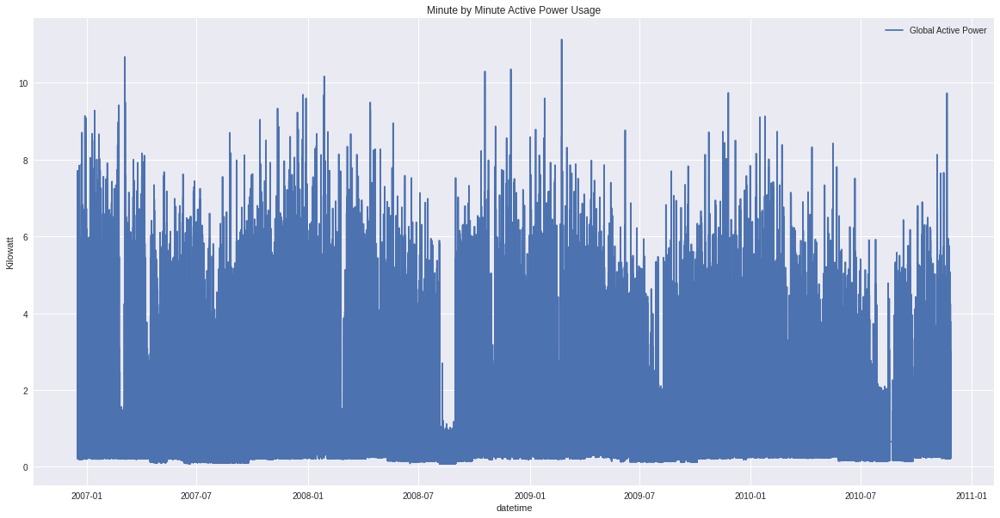

In [ ]:
# create line plot of minute by minute Global Active Power
df_plot = df_plot.sort_values('datetime')
plt.style.use('seaborn')
fig, ax = plt.subplots(figsize=(20,10))
plt.plot(df_plot.index,df_plot,label='Global Active Power')
plt.legend(loc="upper right")
ax.set_ylabel('Kilowatt')
ax.set_xlabel('datetime')
ax.set_title('Minute by Minute Active Power Usage')
plt.show()

As expected, plotting the minute-by-minute data is not very useful, but it does show us where the missing data was imputed and gives us a general sense of the seasonality. Let's see what we can learn by aggregating to weekly demand.

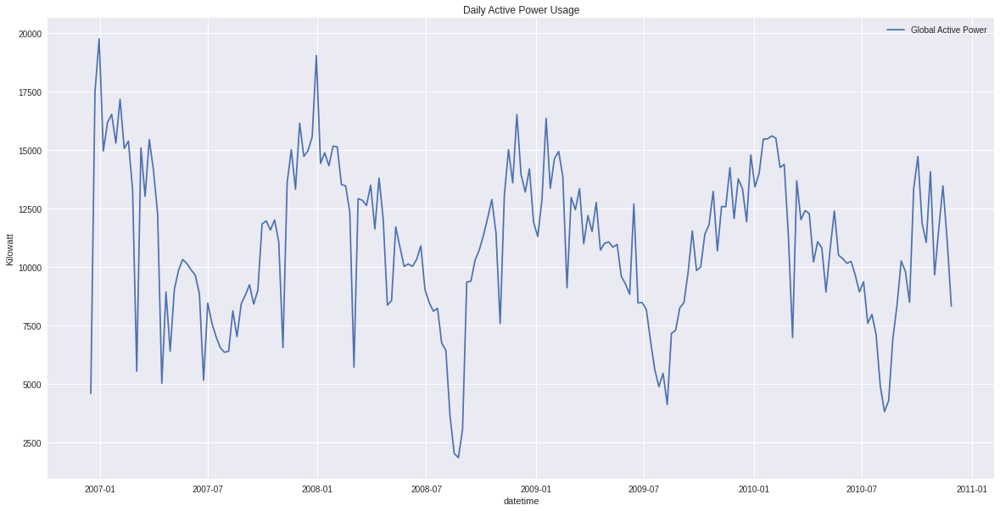

In [ ]:
# create line plot of week by week Global Active Power
df_plot = df_plot.sort_values('datetime')
df_simplot = df_plot.resample('W').sum()
fig, ax = plt.subplots(figsize=(20,10))
plt.plot(df_simplot.index,df_simplot,label='Global Active Power')
plt.legend(loc="upper right")
ax.set_ylabel('Kilowatt')
ax.set_xlabel('datetime')
ax.set_title('Daily Active Power Usage')
plt.show()

The above plot is much more informative, showing us very clearly that there is a seasonal demand for power, with the highest demand for electricity coming in the winter and the least demand coming in the summer. It also shows us that the peak demand has declined year over year. Let's break it down to the sub_metering data to see if we can get a sense of how this household is using electricity.

## *Sub Meter Plots*

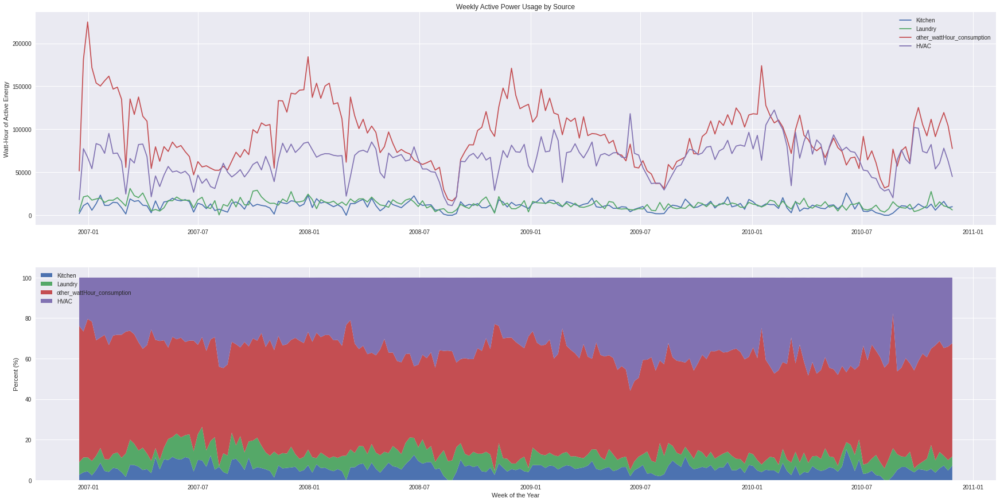

In [ ]:
#get data for the sub-meter plots and aggregate to the week level
df_multiplot = df[['Kitchen','Laundry','other_wattHour_consumption','HVAC']]
df_multiplot = df_multiplot.resample('w').sum()

#transform data for us in a stackplot
df_stack = df_multiplot.T.reset_index()
df_stack = df_stack.append(df_stack.sum(), ignore_index=True)
df_stack = df_stack.set_index('index')
df_stack = df_stack.div(df_stack.loc[df_stack.index[-1]], axis=1).mul(100).round(2)

# generate a stack plot and a line plot of sub-meter data 
fig, ax= plt.subplots(figsize=(30,15))

plt.subplot(2,1,2)
plt.stackplot(df_stack.T.index,df_stack.iloc[:4,:],labels = list(df_stack.index[:4]))
plt.ylabel('Percent (%)')
plt.xlabel('Week of the Year')
plt.legend(loc="upper left")

plt.subplot(2,1,1)
for y in df_multiplot.columns:
  plt.plot(df_multiplot.index,df_multiplot[y],label=y)
plt.legend(loc="upper right")
plt.title('Weekly Active Power Usage by Source')
plt.ylabel('Watt-Hour of Active Energy')

plt.show()

## *Sub Metering Analysis*
By looking at the sub-metering level, we get a sense of how the various sources of electricity consumption are used in relaion to each other. Pretty clearly, the HVAC sub-meter and the Other sources (perhaps consisting of household items like personal computers, televisions and lighting) make up the bulk of total consumption and are also the most seasonal. Kitchen and Laundry make up a much smaller percentage of total consumption and are relatively stable over the time series.

## Visualizing Daily Usage
While the above plots are great for seeing the household's general useage trend, I will look for daily consumption trends to get a picture of how this household uses electricity.

Following the example in [this blog post about visualizing electricy demand](https://energycentral.com/c/em/awesome-energy-data-visualization), I create a time series box plot to visualize the household's daily consumption. I aggregate the minute-by-minute Global_active_power into 1 hour bins, taking the sum of the power consumed  in each bin.

For any given 1 hour time interval there are approximately 365 days * 4 years = 1460 observations. These observations are plotted as a box-plot for each 1 hour interval in a day.

## *Daily Usage Plots*

In [ ]:
#resample to minute by minute data by the hour, drop the dates and set the index to be the time of day  
df_60min = df_plot.resample('h').sum()
df_60min.index = df_60min.index.time
df_60min = df_60min.sort_index()
df_60min.head()

,Global_active_power
00:00:00,69.468
00:00:00,49.432
00:00:00,29.080
00:00:00,51.956
00:00:00,21.210


Text(0.5, 1.0, 'Distribution of Active Power Usage by 60min Interval')

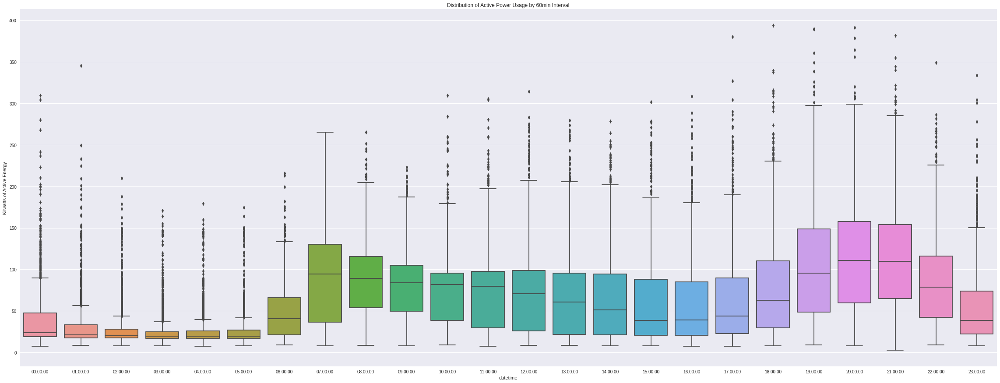

In [ ]:
# plot the data as time series box plot
fig, ax = plt.subplots(figsize=(40,15))
seaborn.boxplot(x=df_60min.index, y=df_60min.Global_active_power)
ax.set_ylabel('Kilwatts of Active Energy')
ax.set_xlabel('datetime')
ax.set_title('Distribution of Active Power Usage by 60min Interval')

## *Daily Usage Analysis*
We can see from the medians for each box plot a clear pattern of usage. Useage is low when from around 11:30 pm to 6:00 am, with high consumption in the morning at 7:00am, decreasing during the day until it increases again the evening (7:00 pm to 9:00 pm). Electricity consumption decreases again between 10:00 pm and 11:00pm. However, for almost all intervals there are a large number of unexplained outliers at the top of each box plot.

Since this dataset is from a household in Sceaux, France, I looked at [the average temperature there.](https://weatherspark.com/y/47850/Average-Weather-in-Sceaux-France-Year-Round) Realizing that there are 3 distinct temperature periods per year, I subset the data accordingly. The subsets are, Cool (November 11 - March 7), Warm (June 12 - September 10) and Normal  (March 8 - June 11).

In [ ]:
#resample to minute by minute data by the hour, create a date column and preset a new column called Season in preparation for setting the cold and warm seasons 
df_seasons = df_plot.resample('h').sum()
df_seasons['Date']=df_seasons.index.date
df_seasons.index=df_seasons.index.time
df_seasons['Season'] = "Normal"

# based on the average temperature data, set the warm and cold seasons for each year
for x in [2006,2007,2008,2009,2010]:
  m_warm = (df_seasons['Date']>=datetime.date(x,6,12))&(df_seasons['Date']<=datetime.date(x,9,10))
  m_cool1 = (df_seasons['Date']>=datetime.date(x,1,1))&(df_seasons['Date']<=datetime.date(x,3,7))
  m_cool2 = (df_seasons['Date']>=datetime.date(x,11,16))&(df_seasons['Date']<=datetime.date(x,12,31))
  df_seasons['Season'] = df_seasons['Season'].mask(m_warm,'Warm')
  df_seasons['Season'] = df_seasons['Season'].mask(m_cool1,'Cool')
  df_seasons['Season'] = df_seasons['Season'].mask(m_cool2,'Cool')

# reset the dataframe to plot the new box plot
df_seasons = df_seasons.drop(columns = 'Date',axis=1)
df_seasons = df_seasons.sort_index()
df_seasons = df_seasons.reset_index()
df_seasons.head()

,index,Global_active_power,Season
0,00:00:00,69.468,Warm
1,00:00:00,49.432,Normal
2,00:00:00,29.080,Warm
3,00:00:00,51.956,Cool
4,00:00:00,21.210,Normal


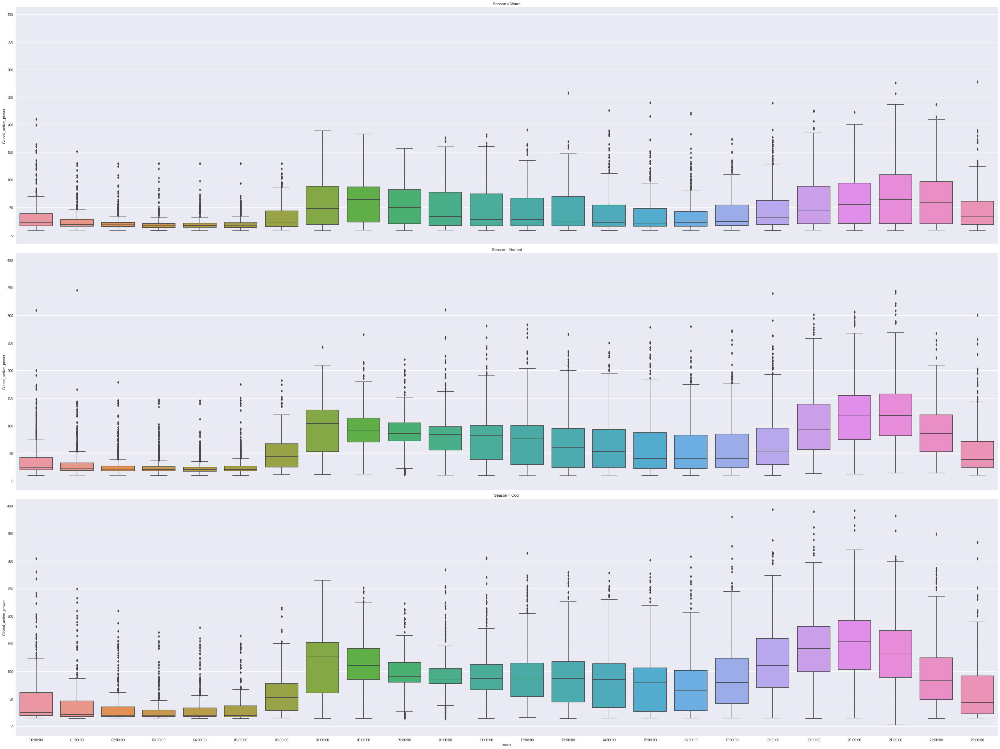

In [ ]:
# create a box plot for each seasons
seaborn.catplot(x="index", y="Global_active_power", col="Season",col_wrap=1,
                data=df_seasons, kind="box",
                height=10, aspect=4);

The above plot splits out the data into three seasons (Cool, Warm and Normal). The data seems to be better described by these plots, as we can see that there are different energy useage trends depending on the temperature and there appear to be fewer outliers per box plot.

## *Reactive Power and Voltage Plots*

Measuring reactive power and voltage is important for [power utility companies seeking to maintain continuous electrical service and understand outages](https://business.directenergy.com/blog/2016/may/reactive-power).


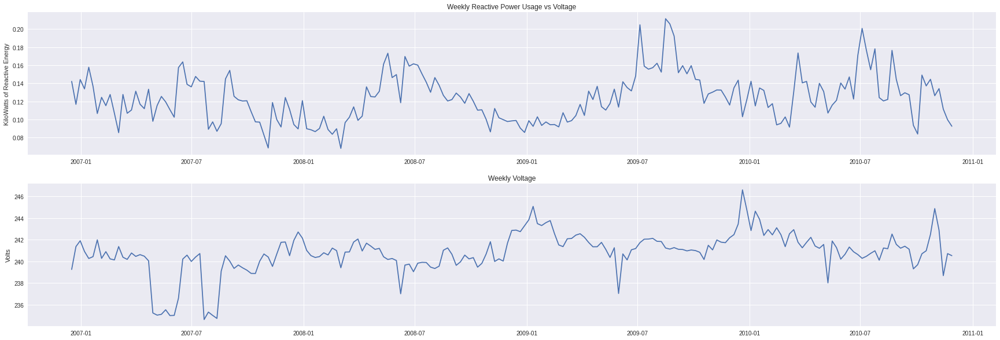

In [ ]:
df_reactive = df[['Global_reactive_power']]
df_reactive = df_reactive.resample('w').mean()

df_voltage = df[['Voltage']]
df_voltage = df_voltage.resample('w').mean()

fig, ax= plt.subplots(figsize=(30,10))
plt.subplot(2,1,1)
plt.plot(df_reactive.index,df_reactive)
plt.title('Weekly Reactive Power Usage vs Voltage')
plt.ylabel('KiloWatts of Reactive Energy')

plt.subplot(2,1,2)
plt.plot(df_voltage.index,df_voltage)
plt.title('Weekly Voltage')
plt.ylabel('Volts')

plt.show()

## *Reactive Power and Voltage Analysis*

While I am not an expert in power generation, there seem to be some interruptions at the peaks of summer, when demand is lowest. Perhaps some adjustments to the electricity mix or available power could address these dips in reactive power.


# *Clustering*

We can also dig a little deeper into the households consumption patterns, by applying various clustering methods following [an example in the tslearn package documentation](https://tslearn.readthedocs.io/en/stable/auto_examples/clustering/plot_kmeans.html#sphx-glr-auto-examples-clustering-plot-kmeans-py) to see if it shows us patterns that are not apparent in the above charts. I chose tslearn [after reading this article](https://towardsdatascience.com/time-series-clustering-deriving-trends-and-archetypes-from-sequential-data-bb87783312b4), as tslearn allows me to easily use dynamic time warping metric for K-means clustering, and allows me to apply the K-shape algorithm, which was identified as a potentially useful algorithm for clustering energy consumption in the above article and also in [this 2017 paper by J. Yang et al](https://www.sciencedirect.com/science/article/abs/pii/S0378778817305352).

To visualize the clusters, I will be [following the example of this blog](https://towardsdatascience.com/clustering-electricity-profiles-with-k-means-42d6d0644d00). Mimicing the linked example will allow me to show the clusters in an appealing way, by assigning the cluster tag to each observation and plotting the median value of each cluster over the original data. I will also output the raw cluster centers.

In [ ]:
#change the data into a form that better suits time series clustering
def cleanForClustering(data):
  df_prep = data.resample('H').sum()
  df_prep['Time']=df_prep.index.time
  df_prep.index=df_prep.index.date

  #pivot the dataframe so that the daily observations are in the y axis and time is on the x axis
  cluster_pivot = df_prep.pivot(columns='Time')
  cluster_pivot = cluster_pivot.dropna()

  #transform the data set into a format compatible with tslearn
  cluster_matrix = utils.to_time_series_dataset(cluster_pivot)

  #Scale the data so that similar consumption patterns for high and low usage days can be grouped together. 
  cluster_matrix = ts_preprocessing.TimeSeriesScalerMeanVariance().fit_transform(cluster_matrix)
  return cluster_matrix, cluster_pivot

In [ ]:
# setup the k shape clustering model for the sub-meters and find the clusters
def kClustering(method,data):
  if method == 'kmeans':
    # find the optimal number of clusters to use
    sil_scores = []
    for n in range(2,10):
      km = clustering.TimeSeriesKMeans(n_clusters=n, metric="dtw", random_state=12345) 
      sil_scores.append((metrics.silhouette_score(utils.to_sklearn_dataset(data), km.fit_predict(data), metric="mahalanobis"),n))
    
    optimal_k = max(sil_scores)[1]
    # run the kmeans algorithm and find the clusters 
    km = clustering.TimeSeriesKMeans(n_clusters=optimal_k, metric="dtw", random_state=12345)
    y_pred = km.fit_predict(data)
    return y_pred, optimal_k, km.cluster_centers_

  elif method == 'kshape':
    # find the optimal number of clusters to use
    sil_scores = []
    for n in range(2,10):
      ks = clustering.TimeSeriesKMeans(n_clusters=n, random_state=12345) 
      sil_scores.append((metrics.silhouette_score(utils.to_sklearn_dataset(data), ks.fit_predict(data)),n))
    
    optimal_k = max(sil_scores)[1]
    # run the kmeans algorithm and find the clusters 
    ks = clustering.KShape(n_clusters=optimal_k, random_state=12345)
    y_pred = ks.fit_predict(data)
    return y_pred, optimal_k, ks.cluster_centers_

In [ ]:
def rawClusterCenters(data,cluster_count,centers,labels,title): # the x axis doesn't start at midnight. need to shift it to line up with other plots.
  print('\nHere are the raw cluster centers associated with {}.'.format(title))
  df_clust = pd.DataFrame(utils.to_sklearn_dataset(data)) 
  df_clust = df_clust.set_index(labels, append=True).copy()

  fig, ax= plt.subplots(figsize=(30,10))
  for x in range(cluster_count):
    plt.subplot(3,3,x+1)
    plt.plot(df_clust.xs(x, level=1).T.index,df_clust.xs(x, level=1).T,alpha=0.05, color='k')
    plt.plot(df_clust.xs(x, level=1).T.index,centers[x],'r', label= f'Cluster {x}')
  
    plt.ylabel('Scaled Kilowatts of Active Energy')
    plt.xlabel('Time of Day')
    if x == 0:
      plt.title('Raw Clusters Centers of ' + title + ' Active Power Usage by 1 hour Interval')
    plt.legend(loc="upper right")
  plt.show()

In [ ]:
#using the same methodology as for K-Shape individual plots, but now the clusters are plotting together on one plot
def clusterPlot(labels,data,cluster_count, title):
  print('\nHere are the clusters associated with {}, all together in one plot.'.format(title))
  clusters = pd.Series(labels, name='cluster')
  colors = ['b','r','g','m','gold','c','k','chartreuse','coral','deeppink']
  if cluster_count > len(colors):
    cluster_count = len(colors)
  df_ClustPlot = data.set_index(clusters, append=True).copy()

  fig, ax= plt.subplots(figsize=(30,10))
  color_list = colors[:cluster_count]
  cluster_values = sorted(df_ClustPlot.index.get_level_values('cluster').unique())

  for cluster, color in zip(cluster_values, color_list):
      plt.plot(df_ClustPlot.xs(cluster, level=1).T.droplevel(level=0).index.format(),df_ClustPlot.xs(cluster, level=1).T.droplevel(level=0),alpha=0.02, color=color)
      plt.plot(df_ClustPlot.xs(cluster, level=1).median().droplevel(level=0).index.format(),df_ClustPlot.xs(cluster, level=1).median().droplevel(level=0),color=color, linewidth = 3, ls='--', label= f'Cluster {cluster}')

  ax.set_xticks(np.arange(1,25))
  ax.set_ylabel('Kilowatts of Active Energy')
  ax.set_xlabel('Time of Day')
  ax.set_title('Clusters of ' + title + ' Active Power Usage by 1 hour Interval')
  ax.legend(loc="upper right")
  plt.show()

In [ ]:
def clusterSubPlot(labels,data,cluster_count,title):
  print('\nHere are the individual clusters associated with {}.'.format(title))
  #pull out the cluster labels as a list
  clusters = pd.Series(labels, name='cluster')
  #create a list of possible colours, and ensure that too many clusters doesn't break the script...Note: for robustness, I should use the cmap functions here, but it just wasn't working out for me this time
  colors = ['b','r','g','m','gold','c','k','chartreuse','coral','deeppink']
  if cluster_count > len(colors):
    cluster_count = len(colors)
  #create a copy of the original dataframe used in this clustering exercise, setting the cluster labels as the index
  df_ClustPlot = data.set_index(clusters, append=True).copy()

  # set the plot size
  fig, ax= plt.subplots(figsize=(30,10))
  # set the color list based on the number of clusters
  color_list = colors[:cluster_count]
  cluster_values = sorted(df_ClustPlot.index.get_level_values('cluster').unique())

  # assign a colour to each cluster and plot each days actuals and the median value of the actuals. 
  for cluster, color in zip(cluster_values, color_list):
        plt.subplot(cluster_count, 1, cluster+1)
        #filter the dataframe for each cluster, get only the time index and the values 
        plt.plot(df_ClustPlot.xs(cluster, level=1).T.droplevel(level=0).index.format(),df_ClustPlot.xs(cluster, level=1).T.droplevel(level=0),
            alpha=0.05, color='k'
            )
        #filter the dataframe for each cluster, get only the time index and the values, and take the median
        plt.plot(df_ClustPlot.xs(cluster, level=1).median().droplevel(level=0).index.format(),df_ClustPlot.xs(cluster, level=1).median().droplevel(level=0),
            color=color, linewidth = 3, ls='--', label= f'Cluster {cluster}'
        )
        plt.legend(loc="upper right")
        
  return plt.show()

In [ ]:
def weekdays_count(labels,data,cluster_count):
  weekdays = ['Mon','Tue','Wed','Thu','Fri','Sat','Sun']

  #add the clusters to the dataset as a second level index
  df = data.set_index(labels, append=True).copy()
  df = df.reset_index() #pull both level out into the dataframe
  df.level_0 = pd.to_datetime(df.level_0) #convert to datetime
  df.rename(columns={'level_0':'date','level_1':'cluster'},inplace=True)
  df['dayofweek'] = df.date.dt.dayofweek #get the day of the week number from the new date column
  df = df[['date','cluster','dayofweek']] # reduce the dataframe to the essential columns
  obs_per_day = [] #helper list

  #for each cluster, determine how many observations fall into each day of the week
  for x in range(cluster_count):
    name = 'count_cluster' + str(x)
    name = df[df['cluster']==x]['dayofweek'].value_counts()
    name = name.sort_index().rename('count_cluster' + str(x))
    obs_per_day.append(name.sort_index())

  # turn the list into a dataframe and set the index to be the Days of the Week names
  df_obs_per_day = pd.concat(obs_per_day,axis=1)
  df_obs_per_day['Days of Week'] = weekdays
  df_obs_per_day = df_obs_per_day.set_index('Days of Week')

  display(df_obs_per_day)
  return df_obs_per_day


In [ ]:
def month_count(labels,data,cluster_count): # following the same steps as the weekdays_count function, but for the months of the year
  months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
  df = data.set_index(labels, append=True).copy()
  df = df.reset_index()
  df.level_0 = pd.to_datetime(df.level_0)
  df.rename(columns={'level_0':'date','level_1':'cluster'},inplace=True)
  df['month'] = df.date.dt.month
  df = df[['date','cluster','month']]
  obs_per_month = []

  for x in range(cluster_count):
    name = 'count_cluster' + str(x)
    name = df[df['cluster']==x]['month'].value_counts()
    name = name.sort_index().rename('count_cluster' + str(x))
    obs_per_month.append(name.sort_index())

  df_obs_per_month = pd.concat(obs_per_month,axis=1)
  df_obs_per_month['Month'] = months
  df_obs_per_month = df_obs_per_month.set_index('Month')

  display(df_obs_per_month)
  return df_obs_per_month

In [ ]:
def seasons_count(labels,data,cluster_count): # following the same steps as the weekdays_count function, but for the three seasons of the year
  seasons = ['warm','cool','normal']
  df = data.set_index(labels, append=True).copy()
  df = df.reset_index()
  df.level_0 = pd.to_datetime(df.level_0).dt.date
  df.rename(columns={'level_0':'date','level_1':'cluster'},inplace=True)
  df['Season'] = "Normal"

  # based on the average temperature data, set the warm and cold seasons for each year
  for x in [2006,2007,2008,2009,2010]:
    m_warm = (df['date']>=datetime.date(x,6,12))&(df['date']<=datetime.date(x,9,10))
    m_cool1 = (df['date']>=datetime.date(x,1,1))&(df['date']<=datetime.date(x,3,7))
    m_cool2 = (df['date']>=datetime.date(x,11,16))&(df['date']<=datetime.date(x,12,31))
    df['Season'] = df['Season'].mask(m_warm,'Warm')
    df['Season'] = df['Season'].mask(m_cool1,'Cool')
    df['Season'] = df['Season'].mask(m_cool2,'Cool')
    df = df[['date','cluster','Season']]
    obs_per_month = []

  for x in range(cluster_count):
    name = 'count_cluster' + str(x)
    name = df[df['cluster']==x]['Season'].value_counts()
    name = name.sort_index().rename('count_cluster' + str(x))
    obs_per_month.append(name.sort_index())

  df_obs_per_month = pd.concat(obs_per_month,axis=1)
  display(df_obs_per_month)
  return df_obs_per_month

## *Clustering Algorithm Choice*
In preparing the assignment, I noticed that K-Shape is significantly faster to run than K-Means and provides similar results. That being said, the code above allows for the user to choose between the two. Therefore the code below is set with 'kshape'; to use K-Means clustering, substitute in 'kmeans' into the function.


Here are the individual clusters associated with Global_active_power.


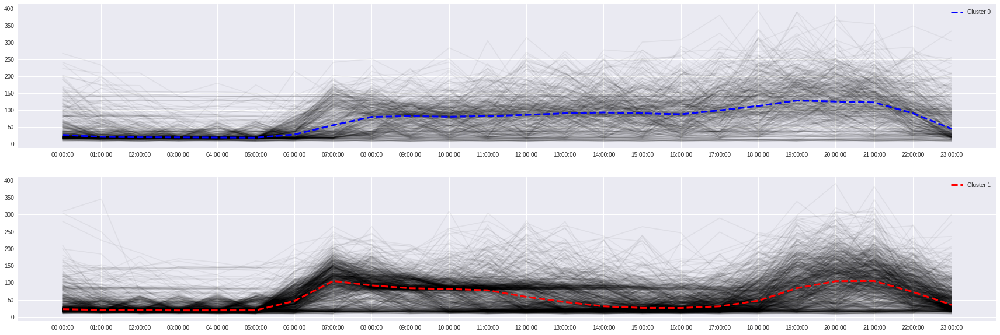


Here are the clusters associated with Global_active_power, all together in one plot.


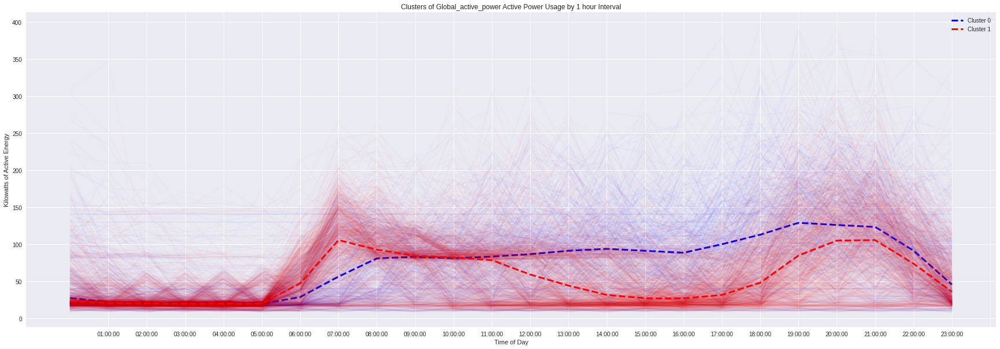


Here are the raw cluster centers associated with Global_active_power.


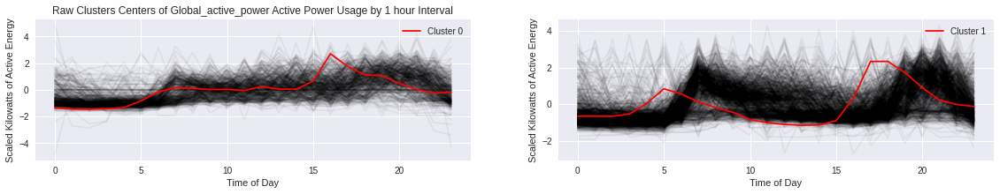


Here are the counts of observations per day of the week.


,count_cluster0,count_cluster1
Days of Week,,
Mon,34,172
Tue,47,159
Wed,51,155
Thu,25,181
Fri,49,156
Sat,125,80
Sun,125,81



Here are the counts of observations per month of the year.


,count_cluster0,count_cluster1
Month,,
Jan,49,75
Feb,38,75
Mar,41,83
Apr,28,92
May,35,89
Jun,33,87
Jul,24,100
Aug,38,86
Sep,32,88



Here are the individual clusters associated with other_wattHour_consumption.


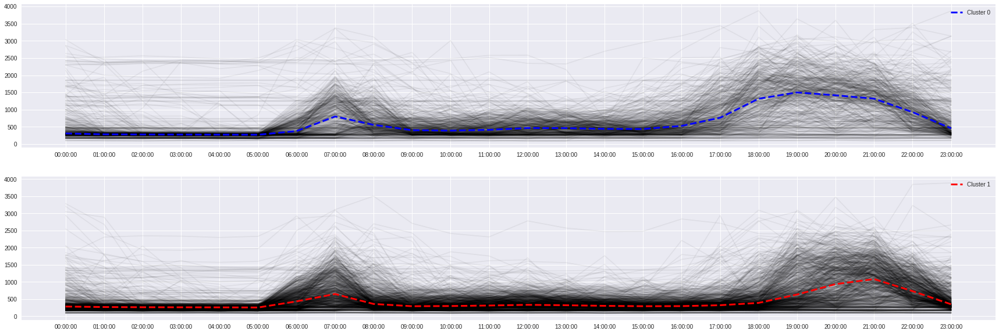


Here are the clusters associated with other_wattHour_consumption, all together in one plot.


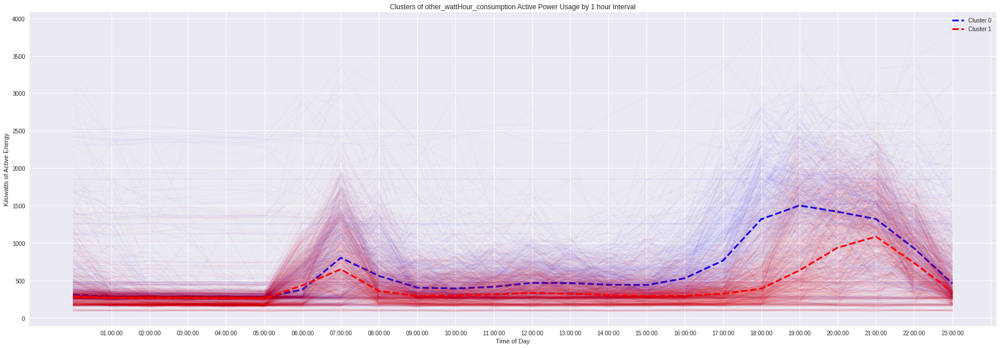


Here are the raw cluster centers associated with other_wattHour_consumption.


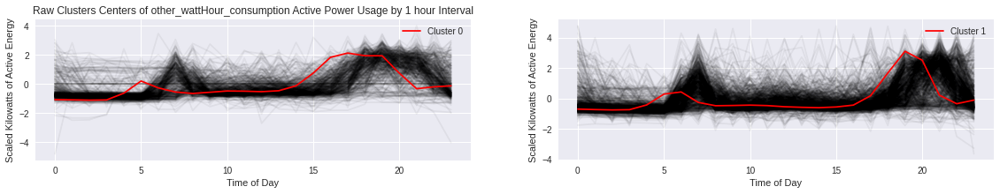


Here are the counts of observations per day of the week.


,count_cluster0,count_cluster1
Days of Week,,
Mon,48,158
Tue,62,144
Wed,54,152
Thu,53,153
Fri,61,144
Sat,109,96
Sun,101,105



Here are the counts of observations per month of the year.


,count_cluster0,count_cluster1
Month,,
Jan,78,46
Feb,48,65
Mar,42,82
Apr,17,103
May,23,101
Jun,24,96
Jul,28,96
Aug,30,94
Sep,12,108



Here are the individual clusters associated with Kitchen.


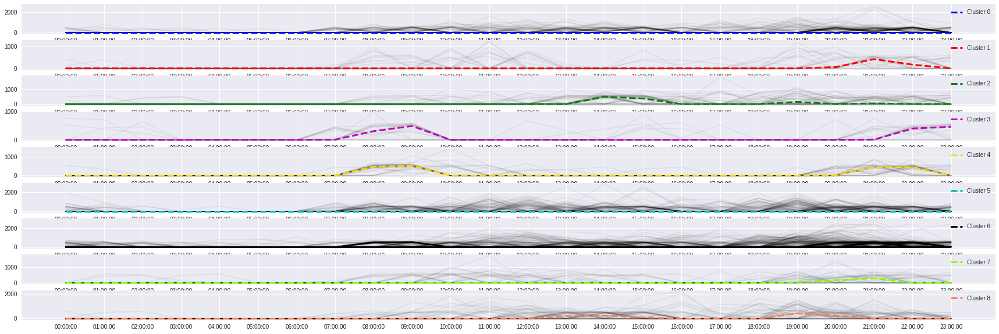


Here are the clusters associated with Kitchen, all together in one plot.


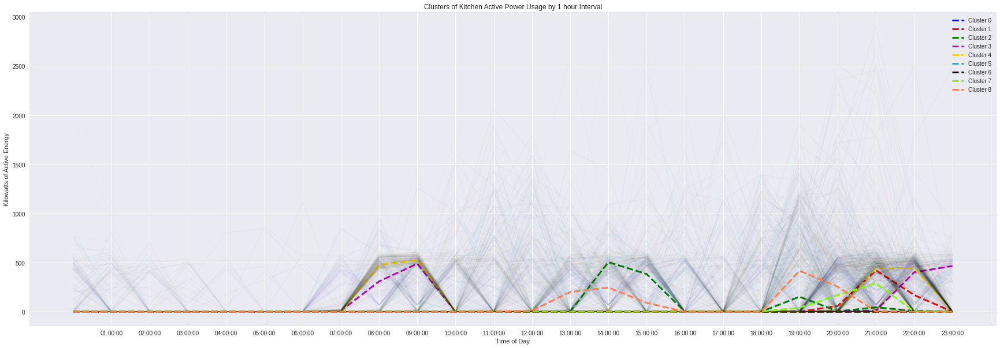


Here are the raw cluster centers associated with Kitchen.


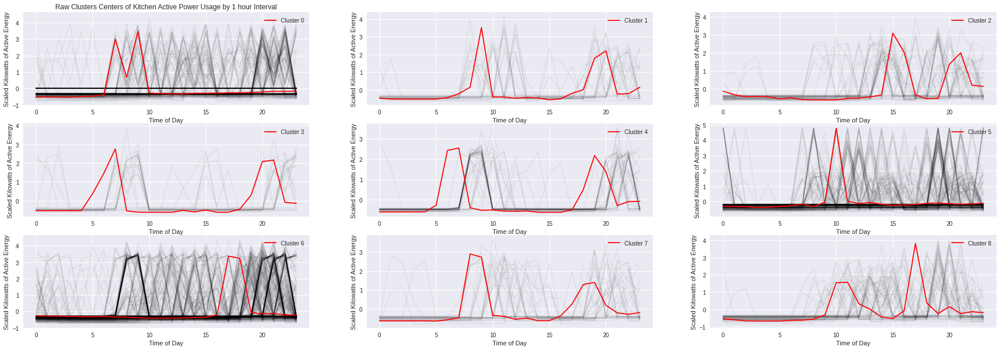


Here are the counts of observations per day of the week.


,count_cluster0,count_cluster1,count_cluster2,count_cluster3,count_cluster4,count_cluster5,count_cluster6,count_cluster7,count_cluster8
Days of Week,,,,,,,,,
Mon,76,3,5,4.0,5,25,84,3,1
Tue,65,1,7,2.0,5,44,72,6,4
Wed,62,8,4,7.0,10,25,83,2,5
Thu,84,3,2,NaN,5,27,79,2,4
Fri,87,2,4,2.0,6,32,61,5,6
Sat,69,4,14,1.0,4,33,55,6,19
Sun,56,3,8,4.0,2,43,66,7,17



Here are the counts of observations per month of the year.


,count_cluster0,count_cluster1,count_cluster2,count_cluster3,count_cluster4,count_cluster5,count_cluster6,count_cluster7,count_cluster8
Month,,,,,,,,,
Jan,39,2.0,4,4.0,2,25,41,3,4.0
Feb,43,2.0,4,3.0,4,17,35,4,1.0
Mar,46,4.0,5,2.0,4,21,36,1,5.0
Apr,45,2.0,3,NaN,1,18,46,2,3.0
May,29,2.0,5,2.0,3,19,48,4,12.0
Jun,37,1.0,6,4.0,6,16,40,3,7.0
Jul,54,NaN,1,NaN,2,14,48,2,3.0
Aug,73,NaN,2,NaN,1,24,23,1,NaN
Sep,37,4.0,4,1.0,5,20,43,1,5.0



Here are the individual clusters associated with Laundry.


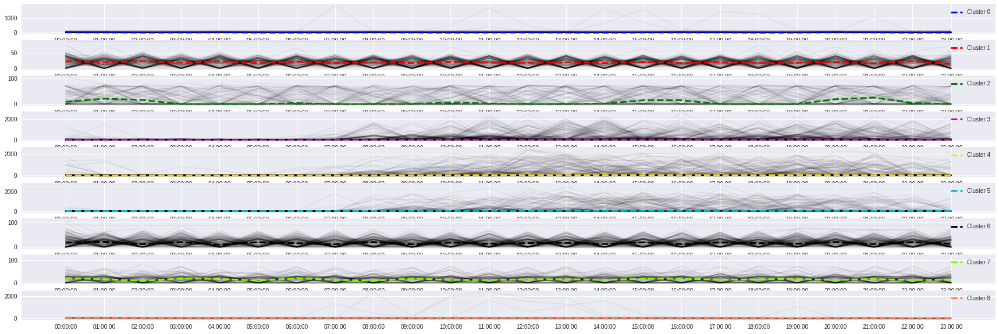


Here are the clusters associated with Laundry, all together in one plot.


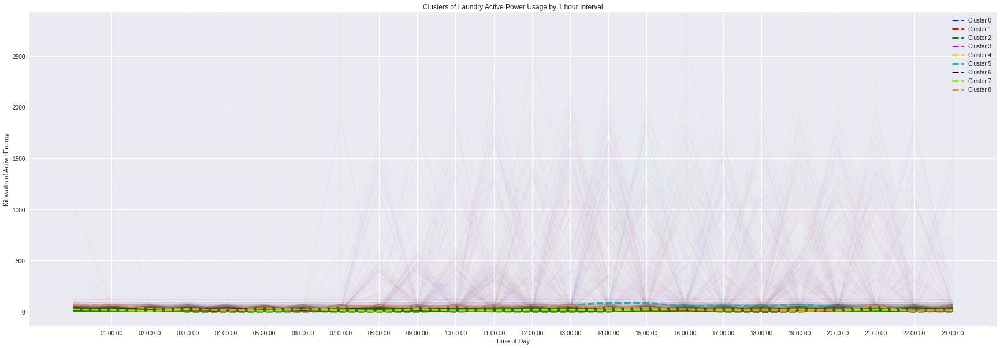


Here are the raw cluster centers associated with Laundry.


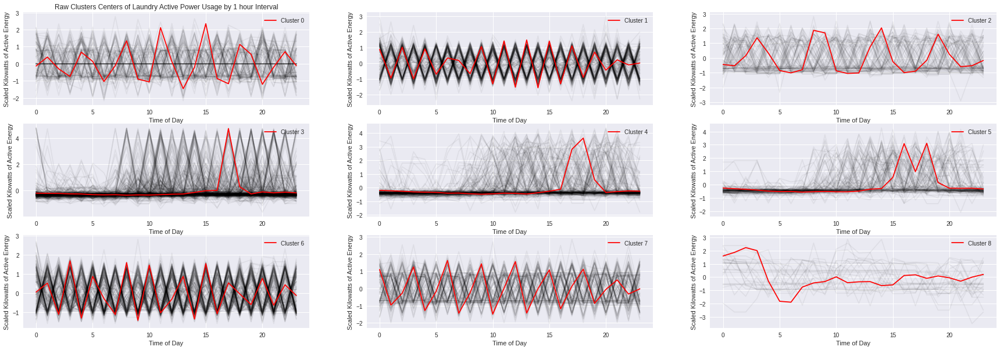


Here are the counts of observations per day of the week.


,count_cluster0,count_cluster1,count_cluster2,count_cluster3,count_cluster4,count_cluster5,count_cluster6,count_cluster7,count_cluster8
Days of Week,,,,,,,,,
Mon,24,37,13,30,20,13,45,21,3
Tue,11,24,11,57,37,19,29,15,3
Wed,20,17,6,66,41,16,19,17,4
Thu,26,34,18,36,18,8,37,22,7
Fri,13,36,17,35,23,15,43,21,2
Sat,11,18,10,74,38,16,19,13,6
Sun,19,15,8,67,36,32,14,13,2



Here are the counts of observations per month of the year.


,count_cluster0,count_cluster1,count_cluster2,count_cluster3,count_cluster4,count_cluster5,count_cluster6,count_cluster7,count_cluster8
Month,,,,,,,,,
Jan,14,5.0,7.0,41,25,7,17,8.0,NaN
Feb,7,NaN,10.0,30,21,9,9,27.0,NaN
Mar,6,3.0,21.0,29,24,11,24,3.0,3.0
Apr,16,10.0,14.0,31,19,8,9,8.0,5.0
May,4,28.0,NaN,40,17,14,19,NaN,2.0
Jun,8,37.0,3.0,32,18,13,8,NaN,1.0
Jul,15,29.0,1.0,29,10,9,15,12.0,4.0
Aug,19,22.0,NaN,21,13,5,14,27.0,3.0
Sep,8,6.0,9.0,34,15,8,24,14.0,2.0



Here are the individual clusters associated with HVAC.


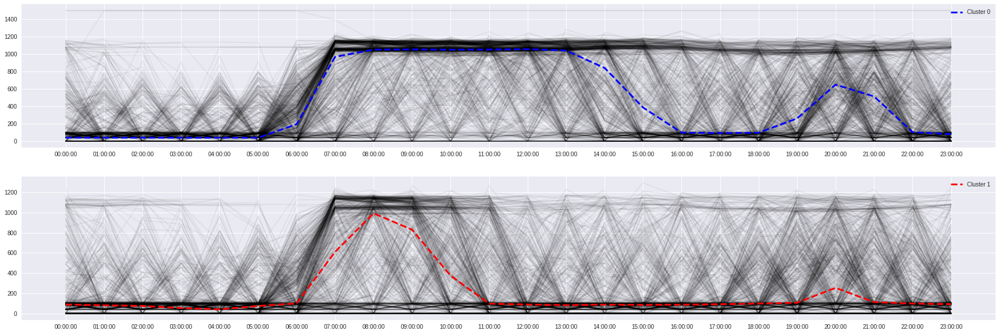


Here are the clusters associated with HVAC, all together in one plot.


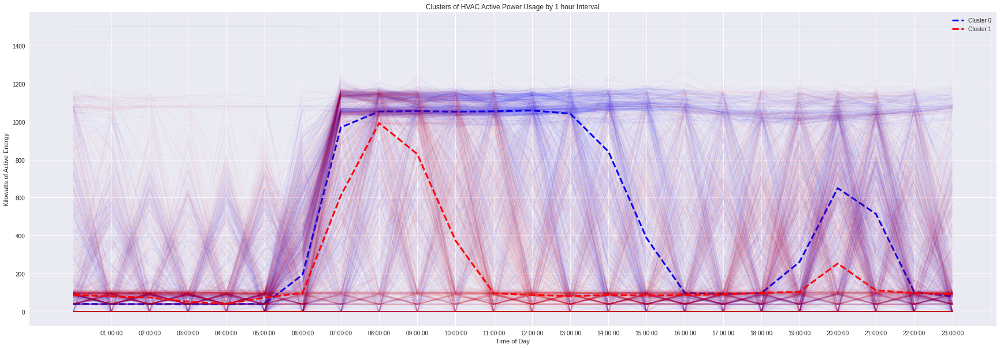


Here are the raw cluster centers associated with HVAC.


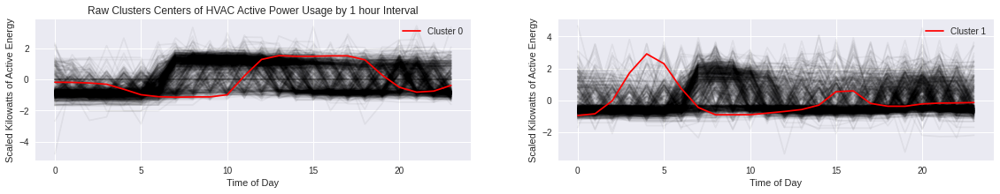


Here are the counts of observations per day of the week.


,count_cluster0,count_cluster1
Days of Week,,
Mon,100,106
Tue,106,100
Wed,98,108
Thu,97,109
Fri,118,87
Sat,117,88
Sun,104,102



Here are the counts of observations per temperature period.


,count_cluster0,count_cluster1
Cool,299,129
Normal,344,304
Warm,97,267


In [ ]:
for x in ['Global_active_power','other_wattHour_consumption','Kitchen','Laundry','HVAC']:
  cluster_matrix, cluster_pivot = cleanForClustering(df[[x]])
  cluster_labels, n_clusters, centers = kClustering('kshape',cluster_matrix) # substitute 'kmeans' for 'kshape' if so desired 
  clusterSubPlot(cluster_labels,cluster_pivot,n_clusters,x)
  clusterPlot(cluster_labels,cluster_pivot,n_clusters,x)
  rawClusterCenters(cluster_matrix,n_clusters,centers,cluster_labels,x)
  print('\nHere are the counts of observations per day of the week.')
  weekdays_count(cluster_labels,cluster_pivot,n_clusters)
  if x == 'HVAC':
    print('\nHere are the counts of observations per temperature period.')
    seasons_count(cluster_labels,cluster_pivot,n_clusters)
  else:
    print('\nHere are the counts of observations per month of the year.')
    month_count(cluster_labels,cluster_pivot,n_clusters)
    

## *Discussion of Clusters*

### Global Active:
The clustering exercise shows two main consumption patterns. These seem to correspond to days when the family leaves the house during the day, presumably for work or school (Cluster 1), and days where the family stays in, many but not all weekends, as well as holidays and perhaps even sick days (Cluster 0).

Note that it appears that the consumption patterns that we saw in relation to temperature are not apparent in these clusters. Perhaps they are masked by the more persistent daily habits of the household.

### Other:
This proxy sub-metering group can be split into two clusters of similar shape, but of different amplitudes. The higher amplitude cluster (Cluster 0) seems to correspond to days when the household used more electricty throughout the day and significantly more starting earlier in the evening. This might correspond to watching television or using the home computer home before and during dinner, whereas Cluster 1 could be days where the family is busier and only watched TV before going to sleep. 

### Kitchen:
From the raw clusters, it appears that most days, the household uses the kitchen at breakfast and dinner time. There are some days where the kitchen is only used once, although in those clusters the timing of the single usage varies throughout the day.

Looking at the cluster charts showing the median of the clusters, the househol seems to expend only a small amount of electricity in the kitchen for each meal, and the timing of the meal seems to vary by an hour or so on each end. However, there seem to be various special occasions when there is a lot of activity in the kitchen. One cluster is clearly special weekends, where both lunch and dinner have elevated eletricity consumption. There are a couple clusters with special breakfasts, although the majority of the high usage clusters spike for dinner.

### Laundry:
This household seems to do laundry throughout the day. Often, there are multiple low amplitude peaks, but sometimes there are fewer, high amplitude peaks. Perhaps this indicates that the household generally does frequent small loads without using their dryer, but other times they are doing big loads and using the dryer.

### HVAC:
Based on the silouette score, which is used to choose the optimal number of clusters in the clustering function, two clusters were chosen. This would imply that two of the three temperature periods, which in this case are the Cool and Normal periods, are similar enough to be grouped together. While more heat is almost certainly used in the cool winter months than in the normal months, the warm months see a significant change in electricity consumption.

The data seems to indicate that in warmer months, the heater comes on around breakfast, but is quickly turned off until the evening when it is turned back on at a lower rate of consumption. During the rest of the year, the household heats the house throughout the morning, shutting off the heat after lunch and then turning it back on in the evening. 

# ***Forecasting***
To forecast the next month of consumption, I will use Pattern Sequence Based Forecasting (PSF). There is [a package in R originally published in 2017](https://www.researchgate.net/publication/304131481_PSF_Introduction_to_R_Package_for_Pattern_Sequence_Based_Forecasting_Algorithm) which is based on [the 2010 work of Martinez Alverez et al](https://ieeexplore.ieee.org/abstract/document/5620917). Since I am using Python, I looked for a package and found [this one](https://github.com/Mayur1009/PSF_Py) which follows the same algorithm as the original PSF article by Martinez Alvarez. According to the 2017 article by Martinez Alverez, in recent years, other researchers have proposed various improvements to the PSF methodology, including [J.Yang et al paper](https://tslearn.readthedocs.io/en/stable/auto_examples/clustering/plot_kmeans.html#sphx-glr-auto-examples-clustering-plot-kmeans-py).

I will also include forecast using a [default XGBoost Regressor model](https://www.youtube.com/watch?v=Kw5Qhqs9VcE) and a [default Support Vector Regression (SVR) model](https://www.youtube.com/watch?v=VNoGo7WluTM&list=LL&index=1&t=3s), as these algorithms were suggested as possible avenues of success by various researchers. In a talk by Myst.ai's [Head of Data Science, Dr. Erin Boyle](https://www.youtube.com/watch?v=Kw5Qhqs9VcE), she mentioned that temperature is an excellent variable for predicting electricity consumption. So, I found some [historical temperature data for Sceaux, France](https://opendata.stackexchange.com/questions/5571/historical-weather-data-in-france-sceaux), and have included it in my XGBoost and SVR.

Along with PSF, SVR and XGBoost, my reading about forecasting household electricity consumption suggests that neural networks, and in particular long short term memory (LSTM) neural networks, might be another good option. However, I have not included a forecast using this method, as I am still learning the fundamentals neural networks. That said, I found this example which [uses the same UCI househould electricity consumption dataset](https://www.kaggle.com/code/cuge1995/lstm-for-household-electric-power-cb225cfe-1) on Kaggle, but replicating it is beyond my current capabilities.



In [ ]:
#load temperature (pulled from NOAA in Fahrenheit) data for Sceaux into a single dataframe
dfs = [pd.read_csv("/content/drive/MyDrive/Colab Notebooks/"+x+"_temps.csv") for x in ['2006','2007','2008','2009','2010']]
temps_df = pd.concat(dfs, ignore_index=True)
temps_df['date'] = temps_df.year.astype(str) + '-' + temps_df.mo.astype(str) + '-' +temps_df.da.astype(str)
temps_df['date'] = pd.to_datetime(temps_df['date'])
temps_df = temps_df.drop(columns = ['year','mo','da'],axis=1)
temps_df = temps_df.set_index('date')
temps_df['temp'] = round((5/9)*(temps_df['temp']-32),1) #convert temperatures to celcius

## Pattern Sequence Based Forecasting

In [ ]:
# get the dataset at the hourly level
df_psf = df_plot.resample('D').sum()

psf_train = df_psf.reset_index().iloc[:1112,1:].copy() #fit the model on all days from 2007 through to the end of 2009
psf_test = df_psf.reset_index().iloc[1112:,1:].copy() # test the forecast on the 2010 data

psf_train = pd.Series(list(preprocessing.StandardScaler().fit_transform(psf_train).reshape(-1)))
psf_test = pd.Series(list(preprocessing.StandardScaler().fit_transform(psf_test).reshape(-1)))

# create the PSF model
psf_forecast = Psf(data = psf_train, cycle = 6)

# Use the model to predict the test dataset
prediction = psf_forecast.predict(n_ahead=330)

# Print the model
psf_forecast.model_print()

# check the accuracy of the prediction against the actuals
RSME = metrics.mean_absolute_error(psf_test,prediction)
print('The Root Squared Mean Error is {:.3%}'.format(RSME))



/usr/local/lib/python3.7/dist-packages/PSF_Py/psf.py:75: UserWarning: 
Time Series length is not multiple of 6. Cutting first 2 values!



Original time-series : 
 2       0.981191
3       0.131037
4       1.015856
5       0.211559
6       1.198638
          ...   
1107    0.967949
1108    0.807679
1109    0.734733
1110    1.372220
1111    0.993946
Length: 1110, dtype: float64

k =  5

w =  7

cycle =  6

dmin =  -2.1079114308594953

dmax =  5.04442078463057

type =  <class 'PSF_Py.psf.Psf'>
The Root Squared Mean Error is 124.282%


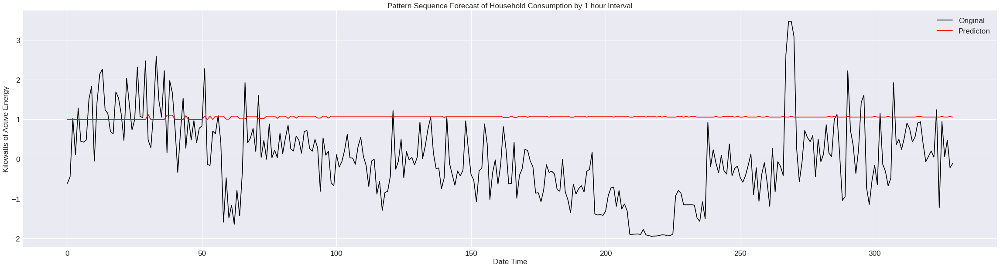

In [ ]:
# Modification of the Psf_py plotting function to visually compare the test data set and the prediction 
x = psf_test

b = prediction
pred = pd.Series(data=list(b))


# change the default aesthetics of matplotlib plot
params = {'legend.fontsize': 'xx-large',
          'figure.figsize': (40, 10),
          'axes.labelsize': 'xx-large',
          'axes.titlesize': 'xx-large',
          'xtick.labelsize': 'xx-large',
          'ytick.labelsize': 'xx-large'
          }
plt.rcParams.update(params)

# plot the original data with black colour and dotted line
plt.plot(x, 'k', label = 'Original')

# plot the predictions with red colour and dotted line
plt.plot(pred, 'r', label = 'Predicton')

plt.ylabel('Kilowatts of Active Energy')
plt.xlabel('Date Time')
plt.title('Pattern Sequence Forecast of Household Consumption by 1 hour Interval')
plt.legend()


## Support Vector Regression and XGBoost Regressor

In [ ]:
def forecast(model,data):
  # get daily usage data
  df_reg = data.resample('D').sum()
  df_reg = pd.merge(df_reg,temps_df,left_index=True,right_index=True)
  df_reg =df_reg[['temp', 'Global_active_power']]
  # split into a train and test set. Train on dates up to 2010, test on 2010 data.
  df_reg_train = df_reg.iloc[:1112,:].copy()
  df_reg_test = df_reg.iloc[1112:,:].copy()

  #pull out the temperatures to avoid scaling a 2d array (causes me problems when trying to scale the temps using in the forecast data set, as well as when trying to inverse transform)
  train_temps = df_reg_train['temp'].to_list()
  test_temps = df_reg_test['temp'].to_list()

  df_reg_train = df_reg_train.drop('temp', axis = 1)
  df_reg_test = df_reg_test.drop('temp', axis = 1)

  #scale the train and test set
  scaler = preprocessing.StandardScaler()
  reg_train = scaler.fit_transform(df_reg_train)
  reg_test = scaler.transform(df_reg_test)

  #add the scale to the train and test dataframes for use later in plotting
  df_reg_train['Scaled'] = reg_train
  df_reg_train = df_reg_train.drop(columns = ['Global_active_power'], axis = 1)
  df_reg_test['Scaled'] = reg_test
  df_reg_test = df_reg_test.drop(columns = ['Global_active_power'], axis = 1)

  #turn the dates into numberic for use in the models
  train_dates = list(range(1112))
  test_dates = list(range(1112,1442)) # 1442 is the end of the dataset

  # combine dates with scaled power and temperature
  reg_train = np.insert(reg_train, 0, train_dates, axis=1)
  reg_train = np.insert(reg_train, 1, train_temps, axis=1)
  reg_test = np.insert(reg_test, 0, test_dates, axis=1)
  reg_test = np.insert(reg_test, 1, test_temps, axis=1)

  # get the input and outs for the training and test set
  X_train, y_train = reg_train[:, :-1], reg_train[:, -1]
  X_test, y_test = reg_test[:, :-1], reg_test[:, -1]

  # get the next month of dates into a dataframe for plotting
  df_reg_forecast = pd.DataFrame({'date': pd.date_range(start='2010-11-26', periods=36, freq='D', closed='right')})
  predict_dates = list(range(1442,1477)) # get the future dates on integers

  # combine the temperatures and dates to be forecasted, and pull out the inputs 
  predict_temps_df = temps_df[(temps_df.index >= '2010-11-27')&(temps_df.index <= '2010-12-31')].copy()
  predict_temps_df['Global_active_power'] = 0
  predict_temps = predict_temps_df.temp.to_list()
  predict_temps_df = predict_temps_df.drop('temp',axis=1)
  reg_forecast = scaler.transform(predict_temps_df)
  reg_forecast = np.insert(reg_forecast,0,predict_dates,axis=1)
  reg_forecast = np.insert(reg_forecast,1,predict_temps,axis=1)

  X_forecast, y_forecast = reg_forecast[:, :-1], reg_forecast[:, -1]

  xgb_param_grid = {
      'max_depth' : [3],
      'learning_rate' : [0.05],
      'gamma':[10],
      'reg_lambda':[1.0]
  }
  # {'gamma': 10, 'learning_rate': 0.05, 'max_depth': 3, 'reg_lambda': 1.0, 'scale_pos_weight': 0.01}
  # {'gamma': 1.0, 'learning_rate': 0.05, 'max_depth': 3, 'reg_lambda': 1.0, 'scale_pos_weight': 1}
  # {'gamma': 5.0, 'learning_rate': 0.05, 'max_depth': 3, 'reg_lambda': 1.0, 'scale_pos_weight': 0.1}
  # fit default XGB Regressor 
  if model == 'XGB':
    xgb = XGBRegressor() #(gamma = 10, max_depth=3,learning_rate=0.05,reg_lambda=1.0)
    xgb_reg = xgb.fit(X_train, y_train)
    y_pred_regr = xgb_reg.predict(X_forecast)
    score = xgb_reg.score(X_test, y_test)
    print("XGBoost Regressor r2 Score: {}".format(score))
  else:
    # pass
    svr_reg = svm.SVR(C=1, epsilon=1.2)
    svr_reg.fit(X_train, y_train)
    y_pred_regr = svr_reg.predict(X_forecast)
    score = svr_reg.score(X_test,y_test)
    print("SVR r2 Score: {}".format(score))

  y_pred_regr = y_pred_regr.reshape(-1, 1)
  y_new_inverse = scaler.inverse_transform(y_pred_regr)
  df_simplot_pred = df_reg_forecast.copy()
  df_simplot_pred['y_pred'] = y_new_inverse
  plt.plot(df_simplot_pred['y_pred'])

  plt.show()

###XGBoost Regressor

/usr/local/lib/python3.7/dist-packages/xgboost/core.py:613: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption


[23:08:41] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
XGBoost Regressor r2 Score: -0.8668834067434439


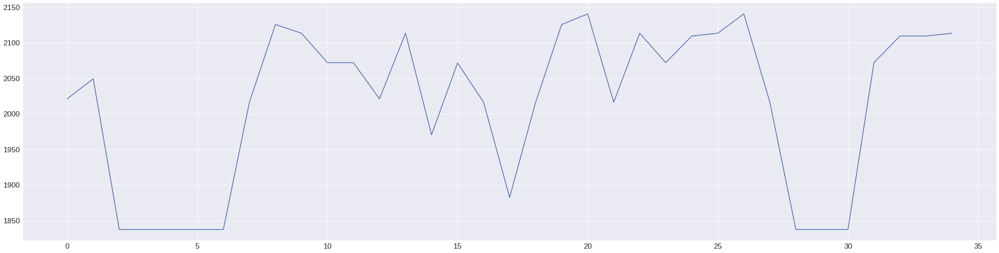

In [ ]:
forecast('XGB',df_plot) #to use XGBoost Regressor, replace 'SVR' with 'XGB'

###Supprt Vector Regression

SVR r2 Score: -0.699557154872656


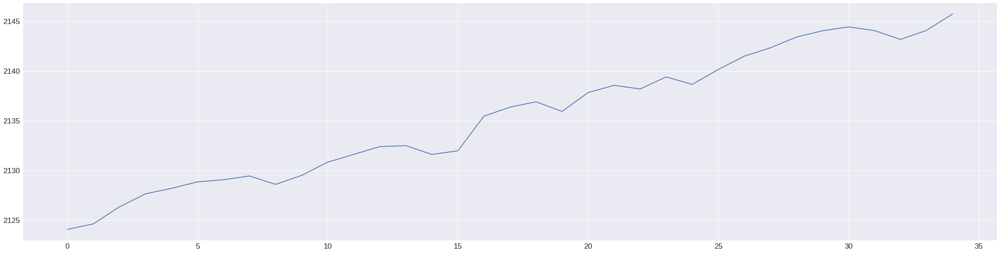

In [ ]:
forecast('SVR',df_plot)

## *Discussion of Forecasting*
As is apparent by the score numbers, these forecasts using the XGBoost ( error = -0.87), SVR (error = -0.69) and PSF (RMSE = 1.24) methods are not very accurate. With more training, particularly in the areas of data preparation and hyperparameter tuning, I would achieve better results.



# *GHG Scope 2 Emissions*
We can use data about carbon emissions for France by looking at data from [a  major French electrity provider RTE](https://www.rte-france.com/en/eco2mix/co2-emissions). Their data indicates the following GHG Scope 2 emissions by source:
* 0.986 t CO2 eq/MWh for coal-fired plants
* 0.777 t CO2 eq /MWh for oil-fired plants
* 0.486 t CO2 eq /MWh for gas-turbine plants
* 0.352 t CO2 eq /MWh for co-generation & combined-cycle plants
* 0.583 t CO2 eq /MWh for other gas-fired plants 's major sources of electricity
* 0.494 t CO2 eq /MWh for household waste

[Our World in Data](https://ourworldindata.org/electricity-mix) gives us a sense of France's electricity mix.

From that data, we can see that between 2007 and 2010, the average percentage contribution of each source of eletricity production was as follows:

* Coal: 4.15%
* Gas: 3.95%
* Oil: 1.88%
* Hydro: 10.81%
* Wind: 1.24%
* Solar: 0.04%
* Other renewables including bioenergy: 0.82%
* Nuclear: 77.10%

We can determine the weighted average GHG Scope 2 emissions per year from the above datasets. I multiplied the weighted emissions by the monthly megawatt hours (calculated using a similar equation to how active watt hours was calculated [earlier in this notebook](https://colab.research.google.com/drive/1tI6iZXmh2LyZPe0s7VOh1Ob4PPFF3biQ#scrollTo=HLPtjXtYjlok&line=4&uniqifier=1)), to find the monthly emissions for this household.

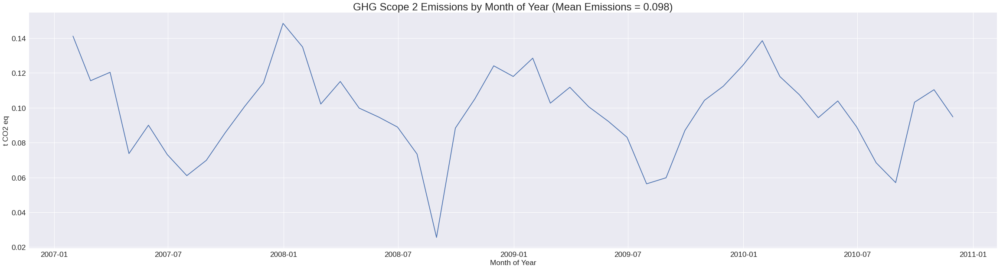

In [ ]:
monthlyGHG = df[['Global_active_power']].copy()
monthlyGHG['MWh'] = monthlyGHG['Global_active_power']*0.001/60
monthlyGHG = monthlyGHG.resample('M').sum()
monthlyGHG = monthlyGHG.drop(columns=['Global_active_power'], axis=1)
monthlyGHG['Year'] = monthlyGHG.index.year
monthlyGHG['Date']= monthlyGHG.index.date

e_mix = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/share-elec-by-source_france.csv")
e_mix = e_mix[(e_mix['Entity']=='France')&(e_mix['Year']>=2007)&(e_mix['Year']<=2010)]

ghg_source = ['Coal','Oil','Gas','Hydro','Solar','Wind','Nuclear','Other']
ePerMWh = [0.986,0.777,0.486,0,0,0,0,0]
ghgEq = {'source' : ghg_source, 'emissions' : ePerMWh}
ghgEq = pd.DataFrame.from_dict(ghgEq).set_index('source')
ghgEq = ghgEq.to_numpy()

e_mix = e_mix.set_index('Year').iloc[:,2:].T.div(100)
e_mix = e_mix.reset_index()
e_mix['index'] = e_mix['index'].str.split(' ',1)
e_mix_df = pd.DataFrame(e_mix['index'].tolist(), columns=['source', 'extra'])
e_mix_df = e_mix_df.drop('extra', axis=1)
e_mix = e_mix.drop('index', axis =1)
e_mix = pd.concat([e_mix,e_mix_df],axis=1).set_index('source')
e_mix = e_mix.to_numpy()

weighted_emissions = e_mix*ghgEq
weighted_emissions = weighted_emissions.sum(axis=0)
weighted_emissions = pd.DataFrame(weighted_emissions)
weighted_emissions['Year'] = [2007,2008,2009,2010]

monthlyGHG = pd.merge(monthlyGHG,weighted_emissions, on='Year')
monthlyGHG = monthlyGHG.set_index('Date')
monthlyGHG['Scope 2 Emissions'] = monthlyGHG['MWh'] *  monthlyGHG[0]

mean_emissions = monthlyGHG['Scope 2 Emissions'].mean()

plt.plot(monthlyGHG['Scope 2 Emissions'])
plt.title('GHG Scope 2 Emissions by Month of Year (Mean Emissions = {:.2})'.format(mean_emissions),size=24)
plt.xlabel('Month of Year')
plt.ylabel('t CO2 eq')

plt.show()

As we can see from the above plot, the mean Scope 2 emissions over the four year period is 0.098 t CO2 equivalent.

Emisssions fluctuate with electricity usage, with peaks upwards of 0.14 t C02 equivalent in the winter and usually fall to around 0.06 t C02 equivalent in the summer.

# *Changes to Reduce Emissions*
Assuming a hypothetical grid where generated power is mostly renewables during the
day, and fossil fuels at night, [both the household and the power company need to make changes to reduce emissions](https://www.repository.cam.ac.uk/bitstream/handle/1810/278279/Plutshack_2016.pdf?sequence=1).

###Household:
This particular household should focus primarily on the Other sub-metering category. This category contributes the most to emissions as a whole, and also has the largest component of use in the evening. They can also reduce their emissions in the laundry, kitchen and HVAC categories.

####"Other" active power usage:
If I am correct in assuming that the Other category is made of the use of personal computers, televisions, lighting and other personal electronics, then I have three primary recommendations for this category. First, ensure that all lights use LED or other ultra-low power bulbs and install sensors and 
timers to ensure that lights are not left on in unoccupied rooms. Second, ensure that all machines used for leisure activities are as energy efficient as possible. Third, where possible the household should use batteries to run machines in the evenings, and charge them in the morning when the grid is drawing power from renewable soures.

####Laundry:
Despite making up a small percentage of total emissions, laundry is a good candidate for reducing household emissions. If possible, the household should avoid doing laundry in the evening and overnight to shift their energy consumption away from times when the grid is powered by more polluting sources.

####Kitchen:
The energy use clusters suggest that the household sometimes prepares  late night meals or snacks that use a lot of eletricity. Avoiding these activities would reduce emissions.

####HVAC:
In the colder months, this household uses a lot of electricity for HVAC in the evening. Were they to invest in better insulation for their home, they may be able to keep their house warmer per KW of power used.Similarlly, investing in low-emission heating and cooling technologies like heatpumps and solar water heaters, would help them reduce their dependence on the  grid overall, and especially when the grid is powered by fossil fuel sources.

### Power Utility Company:
While changes to individual household  behaviour are needed to reduce over emissions, the power company needs to change their behaviour as well. FIrst and foremost, they must continue to transition their energy mix to 100% zero-emission sources, such as renewables and nuclear. 

While that transition is underway, the power utility company should incentivize individual household behaviour changes by setting the electricity tariffs such that it would be cheaper when the grid is less polluting and more expensive during the hours when the grid is more polluting.

Using the knowledge of household consumption patterns, the power company could use what are known as [time of use (TOU) electricity tariffs](https://www.iea.org/commentaries/empowering-electricity-consumers-to-lower-their-carbon-footprint) set their tariffs to incentivize use during the day when the grid is being fed by renewables. For example, increasing the cost of electricity between 6:00 pm and 6:00 am would disincentivize high electricity-use activities such as overnight laundry and keeping lights and personal electronics on late into the night. During the day from 6:00 am to 6:00 pm, the power utility company could subsidize the cost of electricity which might help consumers shift their electricity-intensive activities to those hours. 

